<a href="https://colab.research.google.com/github/legobitna/DeepLearning-basic/blob/main/MaskOn_Covid_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import zipfile
from warnings import filterwarnings
filterwarnings("ignore")

HEIGHT = 120
WEIGHT = 120

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    print(dirname)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
with zipfile.ZipFile("/content/gdrive/MyDrive/kaggle/archive.zip", 'r') as zip_ref:
    zip_ref.extractall("/content")

In [ ]:
# train_dirs = "/content/Face Mask Dataset/Train"
             

# test_dirs = "/content/Face Mask Dataset/Test"

# validation_dirs = "/content/Face Mask Dataset/Validation"

train_dirs = ["/kaggle/input/withwithout-mask/maskdata/maskdata/train",
             "/kaggle/input/withwithout-mask/masks2.0/masks/train",
             "/kaggle/input/face-mask-12k-images-dataset/Face Mask Dataset/Train",
             "/kaggle/input/faces-with-masks"]

test_dirs = ["/kaggle/input/withwithout-mask/maskdata/maskdata/test",
            "/kaggle/input/withwithout-mask/masks2.0/masks/test",
            "/kaggle/input/face-mask-12k-images-dataset/Face Mask Dataset/Test",
            "/kaggle/input/face-mask-detection/dataset"]

validation_dirs = ["/kaggle/input/face-mask-12k-images-dataset/Face Mask Dataset/Validation"]



In [ ]:
fullimg = []
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        fullimg.append(os.path.join(dirname, filename))

In [ ]:
print(fullimg)

['/content/Face Mask Dataset/Test/WithoutMask/385.png', '/content/Face Mask Dataset/Test/WithoutMask/2737.png', '/content/Face Mask Dataset/Test/WithoutMask/5071.png', '/content/Face Mask Dataset/Test/WithoutMask/3777.png', '/content/Face Mask Dataset/Test/WithoutMask/4227.png', '/content/Face Mask Dataset/Test/WithoutMask/150.png', '/content/Face Mask Dataset/Test/WithoutMask/5138.png', '/content/Face Mask Dataset/Test/WithoutMask/636.png', '/content/Face Mask Dataset/Test/WithoutMask/2469.png', '/content/Face Mask Dataset/Test/WithoutMask/5500.png', '/content/Face Mask Dataset/Test/WithoutMask/4557.png', '/content/Face Mask Dataset/Test/WithoutMask/620.png', '/content/Face Mask Dataset/Test/WithoutMask/4150.png', '/content/Face Mask Dataset/Test/WithoutMask/1175.png', '/content/Face Mask Dataset/Test/WithoutMask/90.png', '/content/Face Mask Dataset/Test/WithoutMask/542.png', '/content/Face Mask Dataset/Test/WithoutMask/1798.png', '/content/Face Mask Dataset/Test/WithoutMask/4352.png'

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("Flowing Train")
train_generator1 = train_data_generator.flow_from_directory(
        train_dirs[0],
        target_size=(HEIGHT,WEIGHT),
        batch_size=77,
        interpolation="nearest",
        class_mode='binary',
        classes=["without_mask","with_mask"])
train_generator2 = train_data_generator.flow_from_directory(
        train_dirs[1],
        target_size=(HEIGHT,WEIGHT),
        batch_size=46,
        interpolation="nearest",
        class_mode='binary',
        classes=["0","1"])
train_generator3 = train_data_generator.flow_from_directory(
        train_dirs[2],
        target_size=(HEIGHT,WEIGHT),
        batch_size=80,
        interpolation="nearest",
        class_mode='binary',
        classes=["WithoutMask","WithMask"])
train_generator4 = train_data_generator.flow_from_directory(
        train_dirs[3],
        target_size=(HEIGHT,WEIGHT),
        batch_size=163,
        interpolation="nearest",
        class_mode='binary',
        classes=["_","faces_with_mask"])

print("\nFlowing Test")

test_generator1 = test_data_generator.flow_from_directory(
        test_dirs[0],
        target_size=(HEIGHT,WEIGHT),
        batch_size=66,
        interpolation="nearest",
        class_mode='binary',
        classes=["without_mask","with_mask"])
test_generator2 = test_data_generator.flow_from_directory(
        test_dirs[1],
        target_size=(HEIGHT,WEIGHT),
        batch_size=11,
        interpolation="nearest",
        class_mode='binary',
        classes=["0","1"])
test_generator3 = test_data_generator.flow_from_directory(
        test_dirs[2],
        target_size=(HEIGHT,WEIGHT),
        batch_size=62,
        interpolation="nearest",
        class_mode='binary',
        classes=["WithoutMask","WithMask"])
test_generator4 = test_data_generator.flow_from_directory(
        test_dirs[3],
        target_size=(HEIGHT,WEIGHT),
        batch_size=55,
        interpolation="nearest",
        class_mode='binary',
        classes=["without_mask","with_mask"])

print("\nFlowing Validation")
validation_generator1 = validation_data_generator.flow_from_directory(
        validation_dirs[0],
        target_size=(HEIGHT,WEIGHT),
        batch_size=80,
        interpolation="nearest",
        class_mode='binary',
        classes=["WithoutMask","WithMask"])
withWithoutMask = {"0":"Without Mask","1":"With Mask"}

In [ ]:
# print("Flowing Train")
# train_generator = train_data_generator.flow_from_directory(
#         train_dirs,
#         target_size=(HEIGHT,WEIGHT),
#         batch_size=77,
#         interpolation="nearest",
#         class_mode='binary',
#         classes=["WithoutMask","Withmask"])

# test_generator = test_data_generator.flow_from_directory(
#         test_dirs,
#         target_size=(HEIGHT,WEIGHT),
#         batch_size=66,
#         interpolation="nearest",
#         class_mode='binary',
#          classes=["WithoutMask","Withmask"])

# validation_generator = validation_data_generator.flow_from_directory(
#         validation_dirs,
#         target_size=(HEIGHT,WEIGHT),
#         batch_size=80,
#         interpolation="nearest",
#         class_mode='binary',
#         classes=["WithoutMask","WithMask"])

Flowing Train
Found 5000 images belonging to 2 classes.
Found 509 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


In [ ]:
# def genToTuple(gen):
#     templist = []
#     templist2 = []
#     for i in range(gen.__len__()):
#         tempnext = gen.next()
#         templist.append(tempnext[0])
#         templist2.append(tempnext[1])
#     x=np.concatenate(templist)
#     y=np.concatenate(templist2)
#     return (x,y)

# x_train,y_train  = genToTuple(train_generator)
# x_test,y_test = genToTuple(test_generator)
# x_val,y_val = genToTuple(validation_generator)
def genToTuple(gen):
    templist = []
    templist2 = []
    for i in range(gen.__len__()):
        tempnext = gen.next()
        templist.append(tempnext[0])
        templist2.append(tempnext[1])
    x=np.concatenate(templist)
    y=np.concatenate(templist2)
    return (x,y)

def combine_tuple(*tuples):
    x=np.concatenate([tuples[i][0] for i in range(len(tuples))])
    y=np.concatenate([tuples[i][1] for i in range(len(tuples))])
    return (x,y.astype(int))
    

train_generator1_t = genToTuple(train_generator1)
train_generator2_t = genToTuple(train_generator2)
train_generator3_t = genToTuple(train_generator3)
train_generator4_t = genToTuple(train_generator4)

test_generator1_t = genToTuple(test_generator1)
test_generator2_t = genToTuple(test_generator2)
test_generator3_t = genToTuple(test_generator3)
test_generator4_t = genToTuple(test_generator4)



x_train,y_train = combine_tuple(train_generator1_t,train_generator2_t,train_generator3_t,train_generator4_t)
x_test,y_test = combine_tuple(test_generator1_t,test_generator2_t,test_generator3_t,test_generator4_t)

x_val,y_val = genToTuple(validation_generator1)

In [ ]:
print(x_train.shape,y_train.shape)
print(x_test.shape,y_test.shape)
print(x_val.shape,y_val.shape)

(5000, 120, 120, 3) (5000,)
(509, 120, 120, 3) (509,)
(800, 120, 120, 3) (800,)


In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Dropout, SpatialDropout2D, BatchNormalization, Input, Activation, Dense, Flatten
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.utils import plot_model
from keras.losses import binary_crossentropy

def build_model():
        model = Sequential()
        
        model.add(Input(shape=(HEIGHT,WEIGHT,3,)))

        model.add(Conv2D(filters=16,kernel_size=(2,2),padding="same"))
        model.add(Activation("relu"))
        model.add(SpatialDropout2D(0.25))
        
        model.add(MaxPool2D(pool_size=(4,4)))

        model.add(Conv2D(filters=32,kernel_size=(2,2),padding="same"))
        model.add(Activation("relu"))
        model.add(SpatialDropout2D(0.25))
        
        model.add(MaxPool2D(pool_size=(4,4),strides=(4,4)))
               
        model.add(Flatten())
        
        model.add(Dense(2048))
        model.add(Activation("relu"))
        model.add(Dropout(0.25))
        
        model.add(Dense(1024))
        model.add(Activation("relu"))
        model.add(Dropout(0.2))
        
        
        model.add(Dense(1))
        model.add(Activation("sigmoid"))
        
        optimizer = Adam(lr=0.001)
        model.compile(optimizer = optimizer ,metrics=["accuracy"], loss = binary_crossentropy)
        
        return model

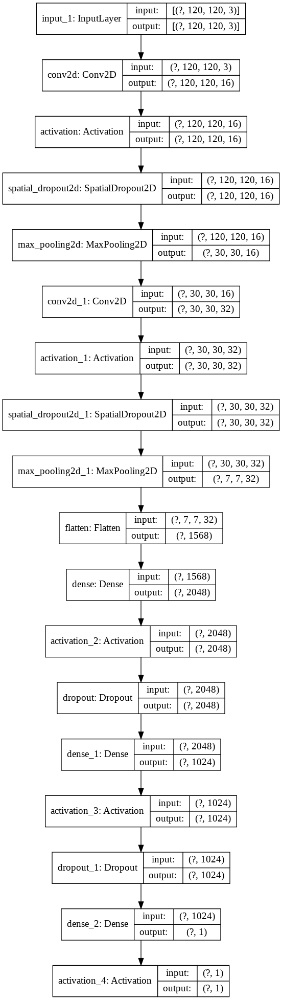

In [ ]:
model = build_model()
plot_model(model,show_shapes=True,show_layer_names=True)

In [ ]:
reducer = ReduceLROnPlateau(monitor='loss',patience=3,factor=0.75,min_lr=0.000001,verbose=1)
stopSign = EarlyStopping(monitor = "loss",patience=20,min_delta=0.000000000001,mode="min")

epochs = 1000000
batch_size = 32
steps_per_epoch = x_train.shape[0] // batch_size
history = model.fit(x_train,y_train,
                    epochs = epochs, 
                    validation_data = (x_val,y_val),
                    verbose = 1,
                    batch_size=batch_size,
                    steps_per_epoch = steps_per_epoch,
                    callbacks=[reducer,stopSign])

Epoch 1/1000000
156/156 [==============================] - 1s 9ms/step - loss: 0.0043 - accuracy: 0.9978 - val_loss: 89.4757 - val_accuracy: 0.5000
Epoch 2/1000000
156/156 [==============================] - 1s 8ms/step - loss: 1.2879e-15 - accuracy: 1.0000 - val_loss: 89.4757 - val_accuracy: 0.5000
Epoch 3/1000000
156/156 [==============================] - 1s 8ms/step - loss: 2.6867e-23 - accuracy: 1.0000 - val_loss: 89.4757 - val_accuracy: 0.5000
Epoch 4/1000000
156/156 [==============================] - 1s 8ms/step - loss: 3.1205e-09 - accuracy: 1.0000 - val_loss: 89.5015 - val_accuracy: 0.5000
Epoch 5/1000000
152/156 [============================>.] - ETA: 0s - loss: 8.6972e-16 - accuracy: 1.0000
Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0007500000356230885.
156/156 [==============================] - 1s 8ms/step - loss: 8.4731e-16 - accuracy: 1.0000 - val_loss: 89.5015 - val_accuracy: 0.5000
Epoch 6/1000000
156/156 [==============================] - 1s 8ms/step - lo

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).


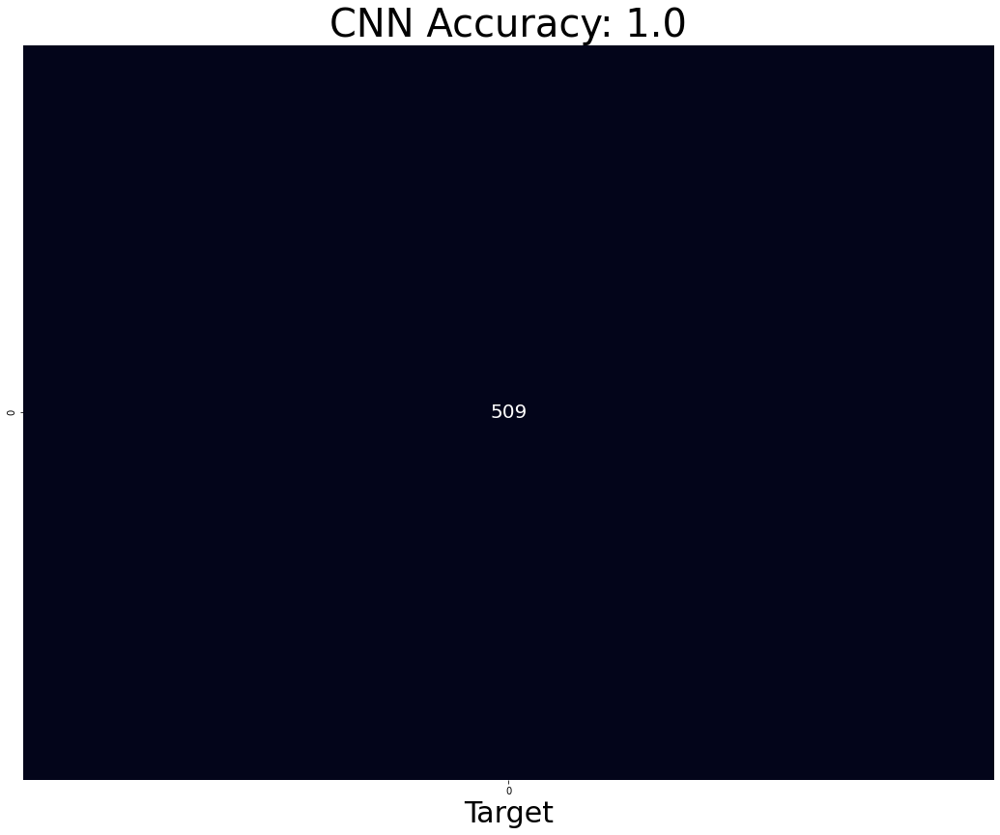

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns

ypred = model.predict_classes(x_test)
plt.subplots(figsize=(18,14))
sns.heatmap(confusion_matrix(ypred,y_test),annot=True,fmt="1.0f",cbar=False,annot_kws={"size": 20})
plt.title(f"CNN Accuracy: {accuracy_score(ypred,y_test)}",fontsize=40)
plt.xlabel("Target",fontsize=30)
plt.show()

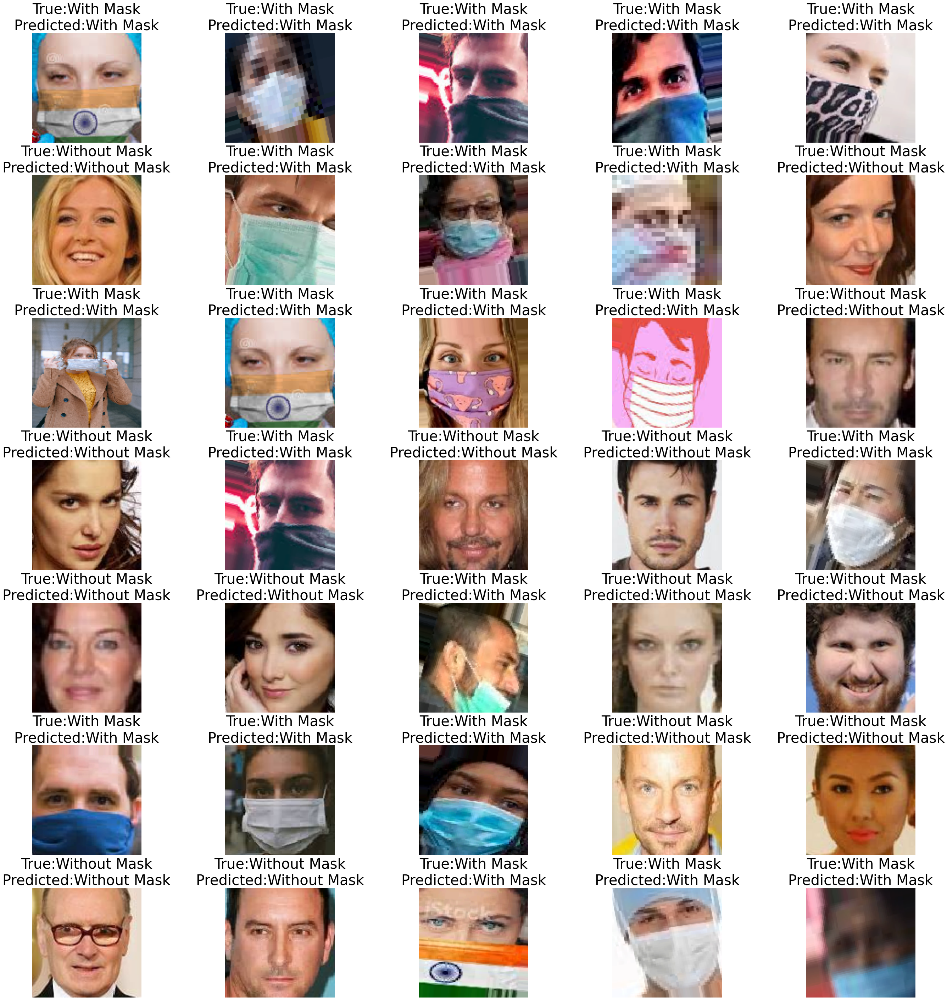

In [ ]:
plt.figure(figsize=(50,50))
tempc = np.random.choice(x_test[y_test == ypred.ravel()].shape[0],35,replace=False)
d = 0
withWithoutMask = {"0":"Without Mask","1":"With Mask"}
for i in tempc:
    plt.subplot(7, 5, d+1)
    d += 1
    tempc = np.random.randint(x_test[y_test == ypred.ravel()].shape[0])
    plt.imshow(x_test[y_test == ypred.ravel()][tempc])

    print(y_test[y_test == ypred.ravel()][tempc])
    # plt.title(f"True:{withWithoutMask[str(y_test[y_test == ypred.ravel()][tempc])]}",
    #           fontsize=40)
    plt.axis("off")
plt.subplots_adjust(wspace=-0.1, hspace=0.3)
plt.show()

In [ ]:
plt.figure(figsize=(50,50))
tempc = np.random.choice(x_test[y_test != ypred.ravel()].shape[0],35,replace=False)
d = 0
for i in tempc:
    plt.subplot(7, 5, d+1)
    d += 1
    tempc = np.random.randint(x_test[y_test != ypred.ravel()].shape[0])
    plt.imshow(x_test[y_test != ypred.ravel()][tempc])
    plt.title(f"True:{withWithoutMask[str(y_test[y_test != ypred.ravel()][tempc])]}\nPredicted:{withWithoutMask[str(ypred.ravel()[y_test != ypred.ravel()][tempc])]}",
             fontsize=40)
    plt.axis("off")
plt.subplots_adjust(wspace=-0.1, hspace=0.3)
plt.show()

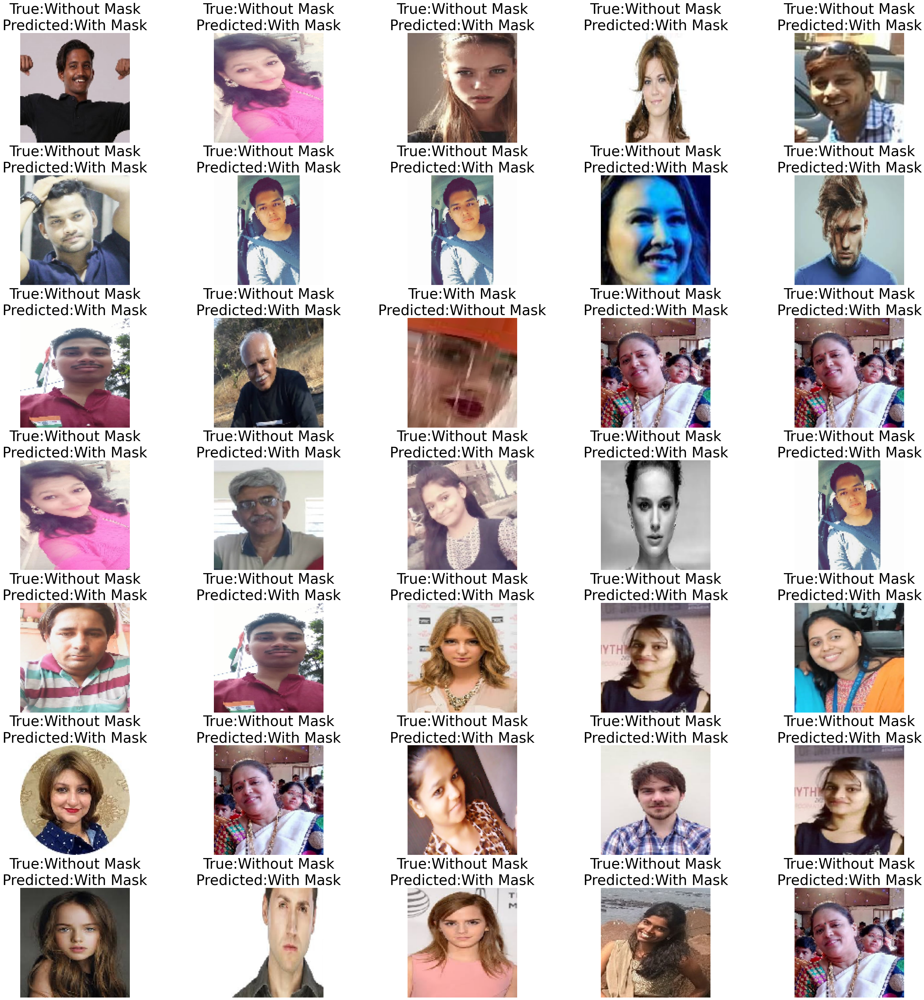

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# 이거하면 history 그래프 그려줌 